In [168]:
import pandas as pd
from seaborn import heatmap
from sklearn.cluster import SpectralClustering
from scipy.cluster.hierarchy import dendrogram
from sklearn.cluster import SpectralClustering
import scipy
import scipy.cluster.hierarchy as sch
import networkx as nx
from collections import defaultdict
from sklearn.cluster import KMeans, AffinityPropagation
#from scipy.cluster.hierarchy import cophenet
#from scipy.spatial.distance import pdist
%pylab inline

Populating the interactive namespace from numpy and matplotlib


/home/vitor/anaconda3/lib/python3.7/site-packages/IPython/core/magics/pylab.py:160: UserWarning: pylab import has clobbered these variables: ['mat']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


In [23]:
def plot_corr(df,size=10):

    # Compute the correlation matrix for the received dataframe
    corr = df.corr()
    
    # Plot the correlation matrix
    fig, ax = plt.subplots(figsize=(size, size))
    cax = ax.matshow(corr, cmap='RdYlGn')
    plt.xticks(range(len(corr.columns)), corr.columns, rotation=90);
    plt.yticks(range(len(corr.columns)), corr.columns);
    
    # Add the colorbar legend
    cbar = fig.colorbar(cax, ticks=[-1, 0, 1], aspect=40, shrink=.8)

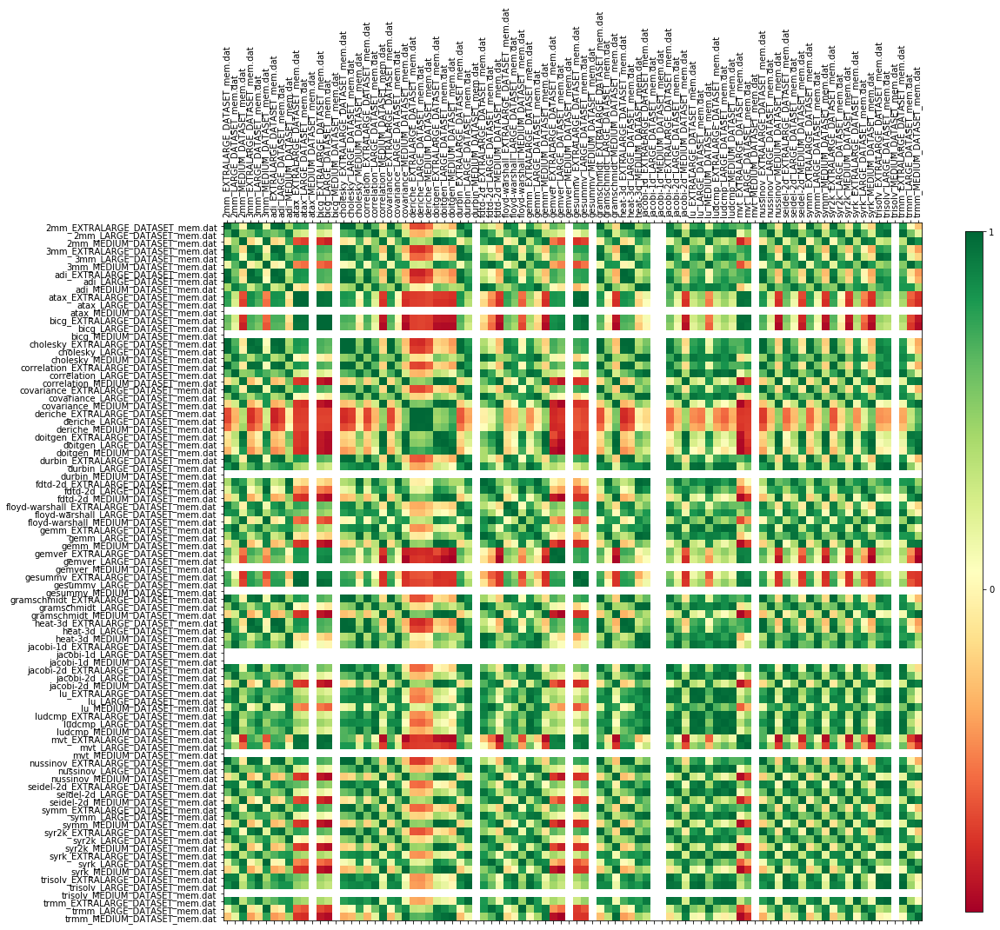

In [24]:
df= pd.read_csv('comparison_all_2.csv',index_col=0)
plot_corr(df, size=18)

/home/vitor/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning: '.reindex_axis' is deprecated and will be removed in a future version. Use '.reindex' instead.
  


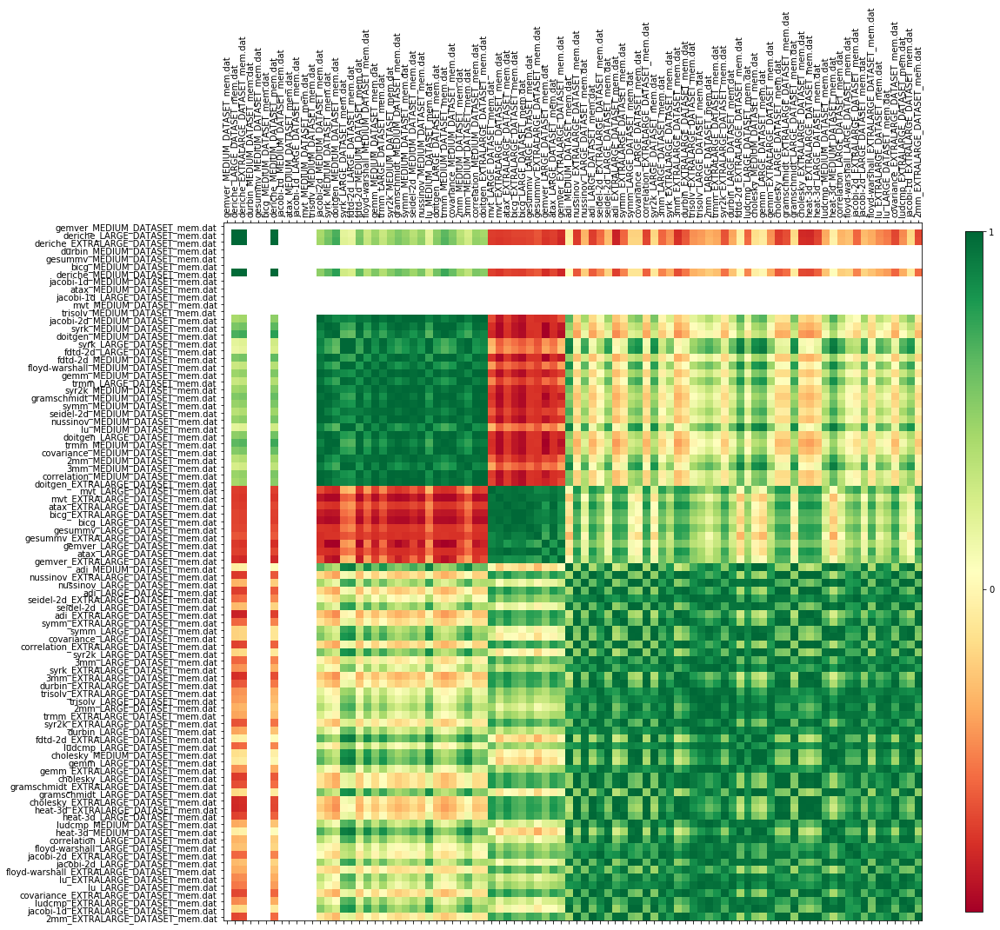

In [25]:
X = df.values
d = sch.distance.pdist(X)   # vector of ('55' choose 2) pairwise distances
L = sch.linkage(X, method='complete')
ind = sch.fcluster(L, 0.5*d.max(), 'distance')
columns = [df.columns.tolist()[i] for i in list((np.argsort(ind)))]
df_new = df.reindex_axis(columns, axis=1)
plot_corr(df_new, size=18)

In [26]:
class Clusters(dict):
    def _repr_html_(self):
        from matplotlib.colors import rgb2hex, colorConverter
        html = '<table style="border: 0;">'
        for c in self:
            hx = rgb2hex(colorConverter.to_rgb(c))
            html += '<tr style="border: 0;">' \
            '<td style="background-color: {0}; ' \
                       'border: 0;">' \
            '<code style="background-color: {0};">'.format(hx)
            html += c + '</code></td>'
            html += '<td style="border: 0"><code>' 
            html += repr(self[c]) + '</code>'
            html += '</td></tr>'

        html += '</table>'

        return html
def get_cluster_classes(den, label='ivl'):
    from collections import defaultdict
    cluster_idxs = defaultdict(list)
    for c, pi in zip(den['color_list'], den['icoord']):
        for leg in pi[1:3]:
            i = (leg - 5.0) / 10.0
            if abs(i - int(i)) < 1e-5:
                cluster_idxs[c].append(int(i))

    cluster_classes = Clusters()
    for c, l in cluster_idxs.items():
        i_l = [den[label][i] for i in l]
        cluster_classes[c] = i_l

    return cluster_classes


How good  0.8932601379789809


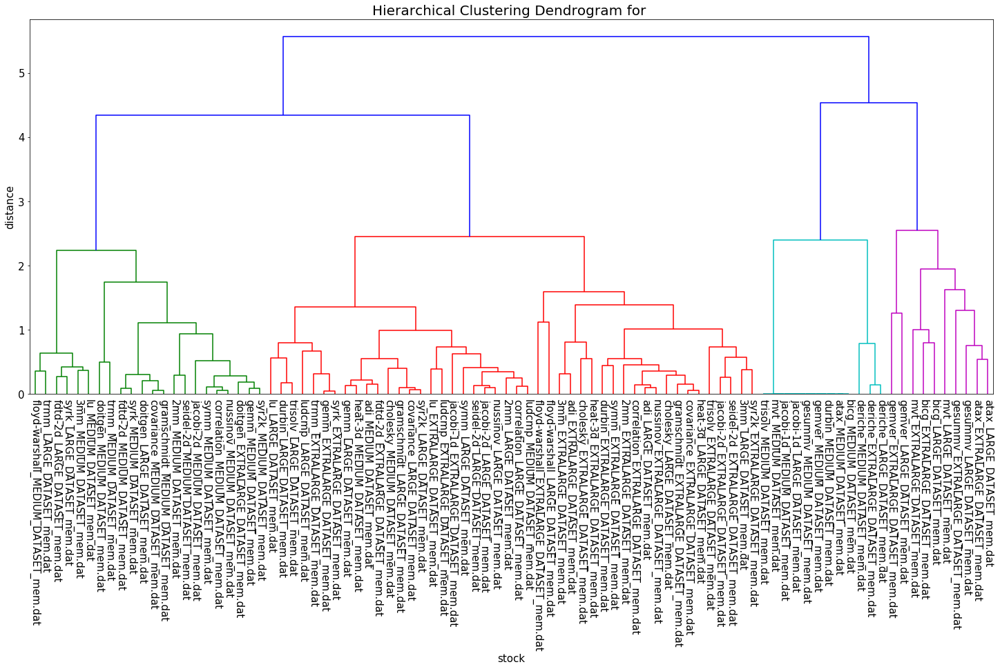

g,"['floyd-warshall_MEDIUM_DATASET_mem.dat', 'trmm_LARGE_DATASET_mem.dat', 'fdtd-2d_LARGE_DATASET_mem.dat', 'syrk_LARGE_DATASET_mem.dat', '3mm_MEDIUM_DATASET_mem.dat', 'lu_MEDIUM_DATASET_mem.dat', 'doitgen_MEDIUM_DATASET_mem.dat', 'trmm_MEDIUM_DATASET_mem.dat', 'fdtd-2d_MEDIUM_DATASET_mem.dat', 'syrk_MEDIUM_DATASET_mem.dat', 'covariance_MEDIUM_DATASET_mem.dat', 'gramschmidt_MEDIUM_DATASET_mem.dat', 'doitgen_LARGE_DATASET_mem.dat', '2mm_MEDIUM_DATASET_mem.dat', 'seidel-2d_MEDIUM_DATASET_mem.dat', 'correlation_MEDIUM_DATASET_mem.dat', 'nussinov_MEDIUM_DATASET_mem.dat', 'symm_MEDIUM_DATASET_mem.dat', 'gemm_MEDIUM_DATASET_mem.dat', 'syr2k_MEDIUM_DATASET_mem.dat', 'doitgen_EXTRALARGE_DATASET_mem.dat', 'jacobi-2d_MEDIUM_DATASET_mem.dat', 'fdtd-2d_LARGE_DATASET_mem.dat']"
r,"['durbin_LARGE_DATASET_mem.dat', 'trisolv_LARGE_DATASET_mem.dat', 'lu_LARGE_DATASET_mem.dat', 'gemm_EXTRALARGE_DATASET_mem.dat', 'syrk_EXTRALARGE_DATASET_mem.dat', 'trmm_EXTRALARGE_DATASET_mem.dat', 'ludcmp_LARGE_DATASET_mem.dat', 'gemm_LARGE_DATASET_mem.dat', 'heat-3d_MEDIUM_DATASET_mem.dat', 'adi_MEDIUM_DATASET_mem.dat', 'fdtd-2d_EXTRALARGE_DATASET_mem.dat', 'covariance_LARGE_DATASET_mem.dat', 'syr2k_LARGE_DATASET_mem.dat', 'gramschmidt_LARGE_DATASET_mem.dat', 'cholesky_MEDIUM_DATASET_mem.dat', 'lu_EXTRALARGE_DATASET_mem.dat', 'ludcmp_EXTRALARGE_DATASET_mem.dat', 'jacobi-2d_LARGE_DATASET_mem.dat', 'nussinov_LARGE_DATASET_mem.dat', 'seidel-2d_LARGE_DATASET_mem.dat', 'correlation_LARGE_DATASET_mem.dat', 'ludcmp_MEDIUM_DATASET_mem.dat', '2mm_LARGE_DATASET_mem.dat', 'symm_LARGE_DATASET_mem.dat', 'jacobi-1d_EXTRALARGE_DATASET_mem.dat', 'floyd-warshall_EXTRALARGE_DATASET_mem.dat', 'floyd-warshall_LARGE_DATASET_mem.dat', '3mm_EXTRALARGE_DATASET_mem.dat', 'adi_EXTRALARGE_DATASET_mem.dat', 'cholesky_EXTRALARGE_DATASET_mem.dat', 'heat-3d_EXTRALARGE_DATASET_mem.dat', 'durbin_EXTRALARGE_DATASET_mem.dat', 'symm_EXTRALARGE_DATASET_mem.dat', 'adi_LARGE_DATASET_mem.dat', 'nussinov_EXTRALARGE_DATASET_mem.dat', 'correlation_EXTRALARGE_DATASET_mem.dat', 'covariance_EXTRALARGE_DATASET_mem.dat', 'heat-3d_LARGE_DATASET_mem.dat', 'gramschmidt_EXTRALARGE_DATASET_mem.dat', 'cholesky_LARGE_DATASET_mem.dat', '2mm_EXTRALARGE_DATASET_mem.dat', 'jacobi-2d_EXTRALARGE_DATASET_mem.dat', 'seidel-2d_EXTRALARGE_DATASET_mem.dat', '3mm_LARGE_DATASET_mem.dat', 'syr2k_EXTRALARGE_DATASET_mem.dat', 'trisolv_EXTRALARGE_DATASET_mem.dat']"
c,"['atax_MEDIUM_DATASET_mem.dat', 'bicg_MEDIUM_DATASET_mem.dat', 'durbin_MEDIUM_DATASET_mem.dat', 'gemver_MEDIUM_DATASET_mem.dat', 'gesummv_MEDIUM_DATASET_mem.dat', 'jacobi-1d_LARGE_DATASET_mem.dat', 'jacobi-1d_MEDIUM_DATASET_mem.dat', 'mvt_MEDIUM_DATASET_mem.dat', 'trisolv_MEDIUM_DATASET_mem.dat', 'deriche_EXTRALARGE_DATASET_mem.dat', 'deriche_LARGE_DATASET_mem.dat', 'deriche_MEDIUM_DATASET_mem.dat']"
m,"['gemver_EXTRALARGE_DATASET_mem.dat', 'gemver_LARGE_DATASET_mem.dat', 'bicg_EXTRALARGE_DATASET_mem.dat', 'bicg_LARGE_DATASET_mem.dat', 'mvt_EXTRALARGE_DATASET_mem.dat', 'atax_EXTRALARGE_DATASET_mem.dat', 'atax_LARGE_DATASET_mem.dat', 'gesummv_LARGE_DATASET_mem.dat', 'gesummv_EXTRALARGE_DATASET_mem.dat', 'mvt_LARGE_DATASET_mem.dat']"


In [193]:
df= pd.read_csv('comparison_all_2.csv',index_col=0)#.corr()
#df= df.replace(np.nan, 0)
Z = sch.linkage(df.values, 'average')
#Z[0]
c, coph_dists = sch.cophenet(Z, sch.distance.pdist(df.values))
print("How good ", c)
plt.figure(figsize=(25, 10))
plt.title('Hierarchical Clustering Dendrogram for ', fontsize=20)
plt.xlabel('stock', fontsize=15)
plt.ylabel('distance', fontsize=15)
den= dendrogram(Z, leaf_rotation=90., leaf_font_size=8., labels = df.columns)
pylab.yticks(fontsize=15)
pylab.xticks(rotation=-90, fontsize=15)
plt.show()
get_cluster_classes(den)

In [156]:
def draw_communities(G, membership):
    from matplotlib import colors
    pos= nx.spring_layout(G)
    fig, ax = plt.subplots(figsize=(20,20))
    club_dict = defaultdict(list)
    for student, club in enumerate(membership):
        club_dict[club].append(student)
    norm = colors.Normalize(vmin=0, vmax=len(club_dict.keys()))
    colors= ['r','b','g','m','y']
    for club, members in club_dict.items():
        nx.draw_networkx_nodes(G, pos,
                               nodelist=members,
                               #node_color=cm.jet(norm(club)),
                               node_color=colors.pop(),
                               node_size=500,
                               alpha=0.8,
                               ax=ax)

    # Draw edges (social connections) and show final plot
    #plt.title("Zachary's Karate Club")
    nx.draw_networkx_edges(G, pos, alpha=0.5, ax=ax)

/home/vitor/anaconda3/lib/python3.7/site-packages/sklearn/cluster/spectral.py:462: UserWarning: The spectral clustering API has changed. ``fit``now constructs an affinity matrix from data. To use a custom affinity matrix, set ``affinity=precomputed``.
  warnings.warn("The spectral clustering API has changed. ``fit``"
/home/vitor/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


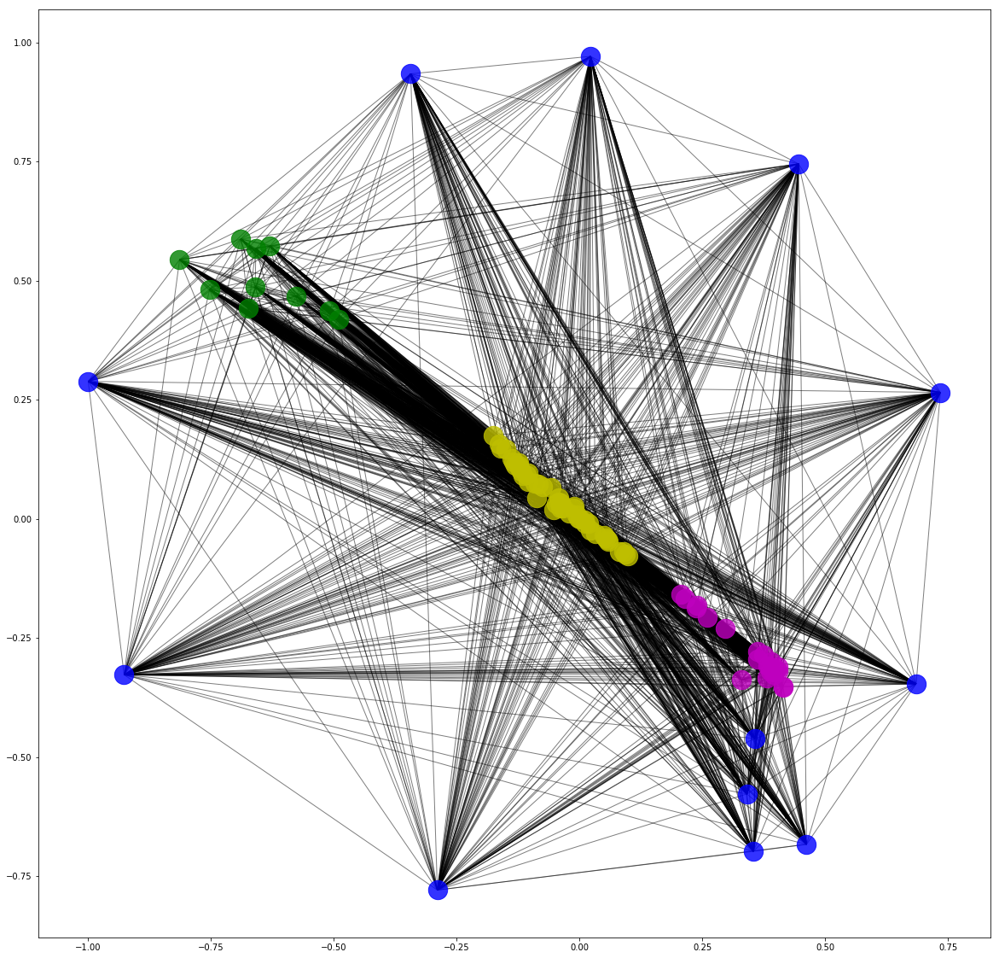

In [196]:
G=nx.Graph()
X= df.values
for i in range(X.shape[0]):
    for j in range(X.shape[1]):
        G.add_edge(i,j,weight=X[i,j]) # weight=X[i,j]
p_clusters= SpectralClustering(4).fit_predict(df.values)
draw_communities(G,p_clusters)

/home/vitor/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


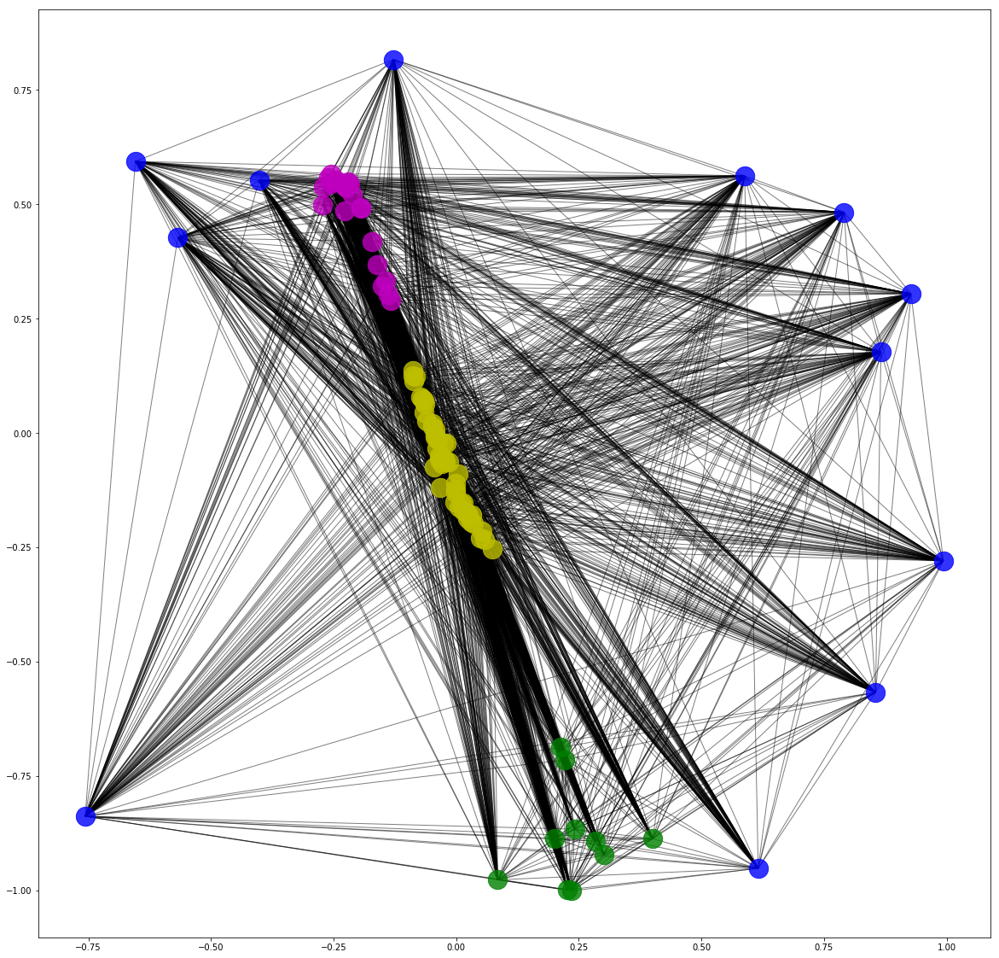

In [198]:
p_clusters= KMeans(n_clusters=4,random_state=0).fit_predict(df.values)
draw_communities(G,p_clusters)

/home/vitor/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


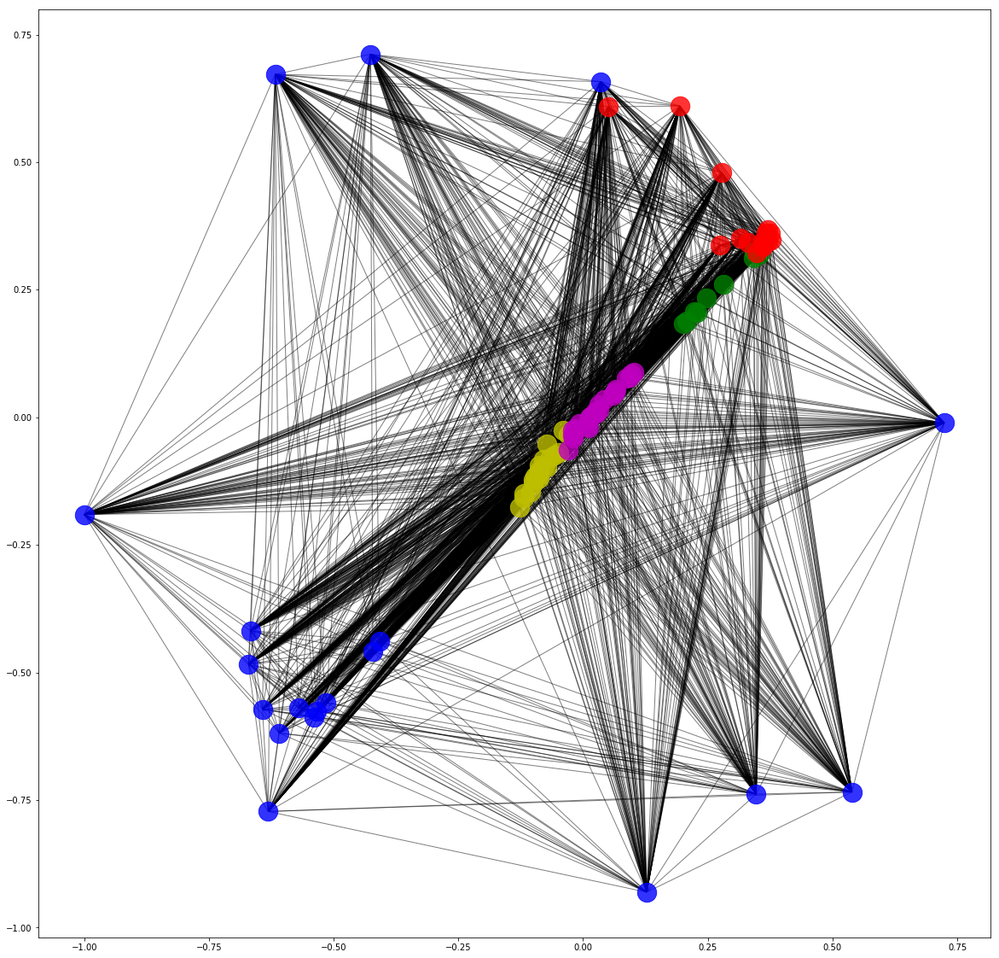

In [191]:
p_clusters= AffinityPropagation(damping=0.6).fit_predict(df.values)
draw_communities(G,p_clusters)

/home/vitor/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


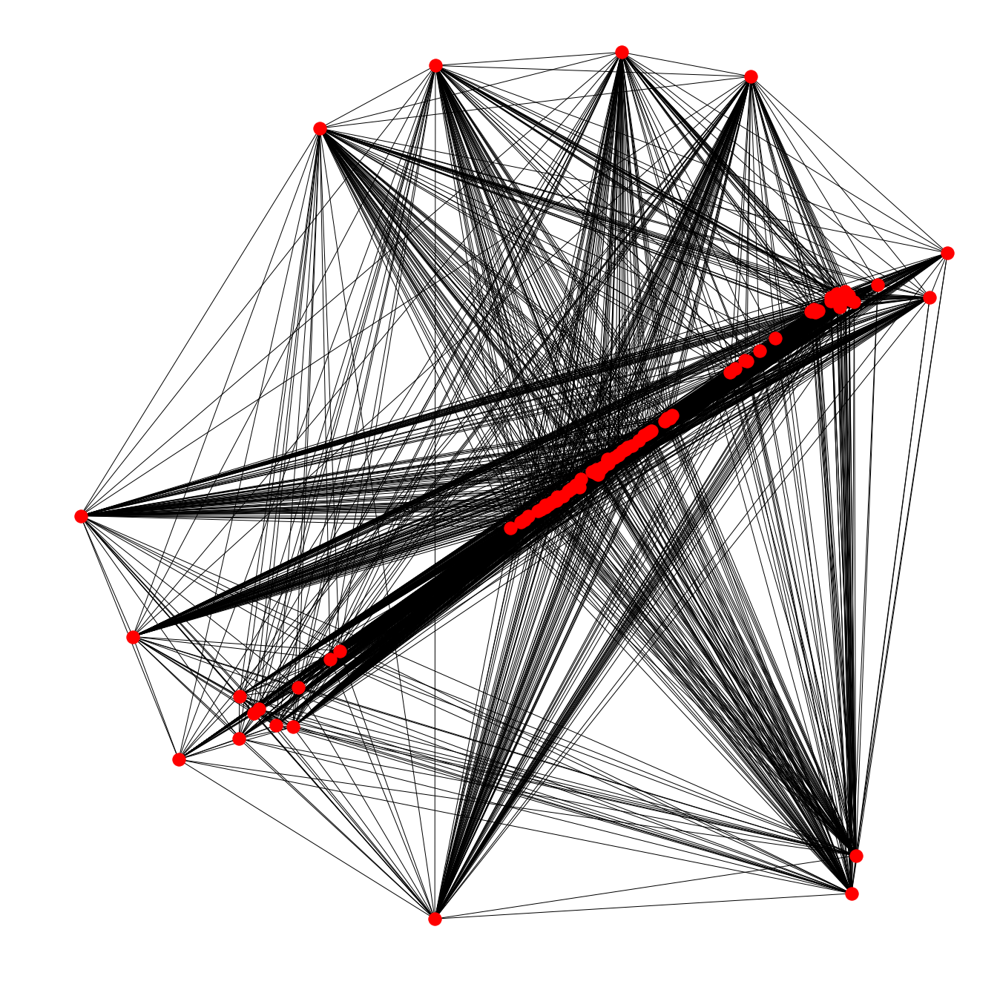

In [153]:
plt.figure(figsize(18,18))
nx.draw(G,pos=nx.spring_layout(G))

In [164]:
from tqdm import tqdm
import os
from profiler import Analyser

bpath= '/home/vitor/Documents/performance_features/analysis/hpc_belgica_v3/'
programs= [p for p in os.listdir(bpath) if not 'MINI' in p and 'SMALL' not in p]
programs= sorted(programs)

df= []
p_names= []
for p in tqdm(programs):
    px= Analyser(bpath+p)
    px.df['input_size']= px.df['PERF_COUNT_HW_INSTRUCTIONS']/px.df['MEM_UOPS_RETIRED:ALL_STORES']
    px.df= px.df.dropna()
    try:
        _, y0= px.interpolate(feature='input_size', npoints= 100)
        df.append(list(y0))
        p_names.append(px.name.split('/')[-1])
    except Exception as e:
        print(e, px.name)

df= pd.DataFrame(np.array(df).T, columns=p_names)
df.to_csv("inputs_all.csv")


  9%|▉         | 8/90 [00:03<00:24,  3.29it/s]

Cant interpolate /home/vitor/Documents/performance_features/analysis/hpc_belgica_v3/atax_MEDIUM_DATASET_mem.dat
Cant interpolate /home/vitor/Documents/performance_features/analysis/hpc_belgica_v3/bicg_MEDIUM_DATASET_mem.dat



 31%|███       | 28/90 [00:10<00:14,  4.39it/s]

Cant interpolate /home/vitor/Documents/performance_features/analysis/hpc_belgica_v3/durbin_MEDIUM_DATASET_mem.dat



 44%|████▍     | 40/90 [00:16<00:20,  2.49it/s]

Cant interpolate /home/vitor/Documents/performance_features/analysis/hpc_belgica_v3/gemver_MEDIUM_DATASET_mem.dat
Cant interpolate /home/vitor/Documents/performance_features/analysis/hpc_belgica_v3/gesummv_MEDIUM_DATASET_mem.dat



 59%|█████▉    | 53/90 [00:20<00:15,  2.42it/s]

Cant interpolate /home/vitor/Documents/performance_features/analysis/hpc_belgica_v3/jacobi-1d_LARGE_DATASET_mem.dat
Cant interpolate /home/vitor/Documents/performance_features/analysis/hpc_belgica_v3/jacobi-1d_MEDIUM_DATASET_mem.dat



 72%|███████▏  | 65/90 [00:32<00:33,  1.35s/it]

Cant interpolate /home/vitor/Documents/performance_features/analysis/hpc_belgica_v3/mvt_MEDIUM_DATASET_mem.dat



 91%|█████████ | 82/90 [00:37<00:02,  2.81it/s]

Cant interpolate /home/vitor/Documents/performance_features/analysis/hpc_belgica_v3/trisolv_MEDIUM_DATASET_mem.dat



100%|██████████| 90/90 [00:37<00:00,  2.39it/s]

In [165]:
df= pd.read_csv("inputs_all.csv",index_col=0)

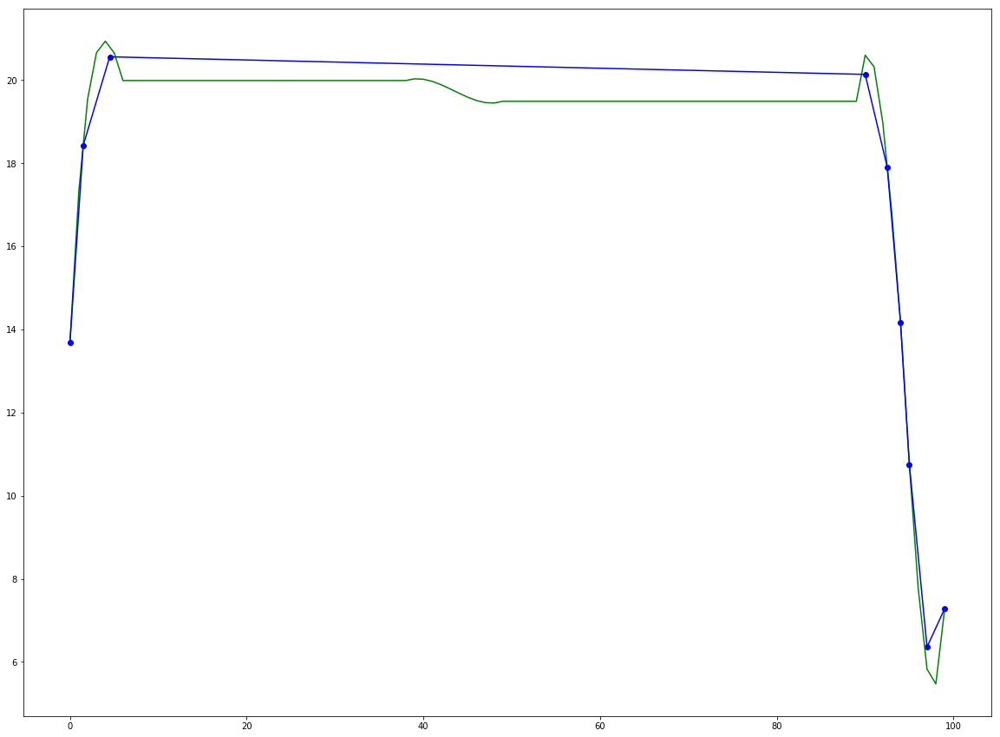

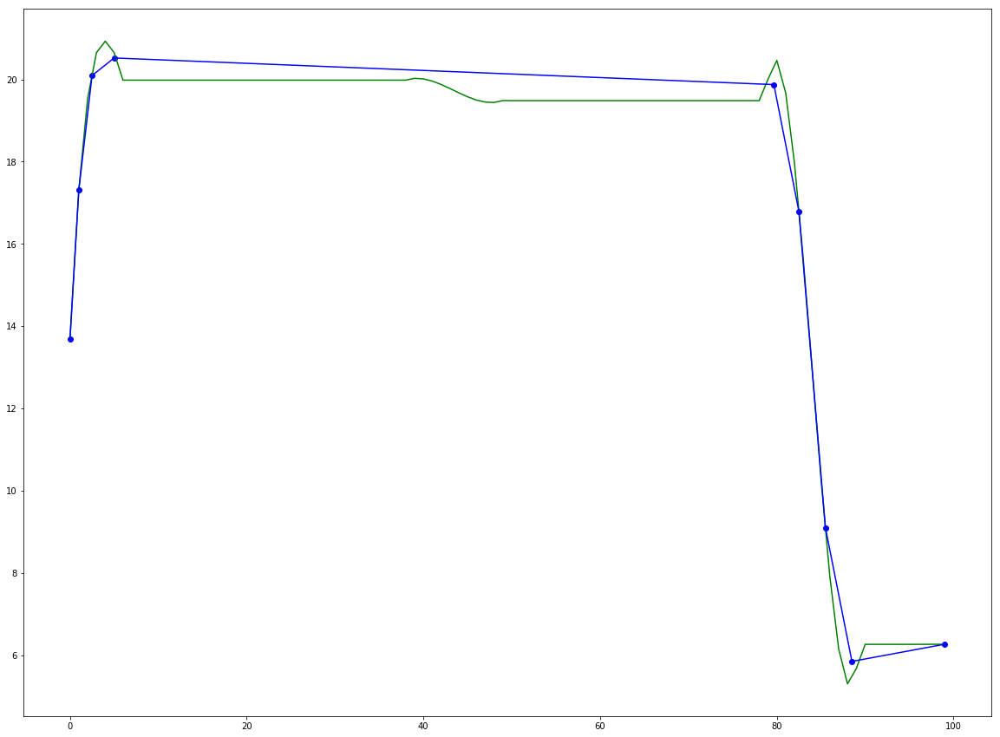

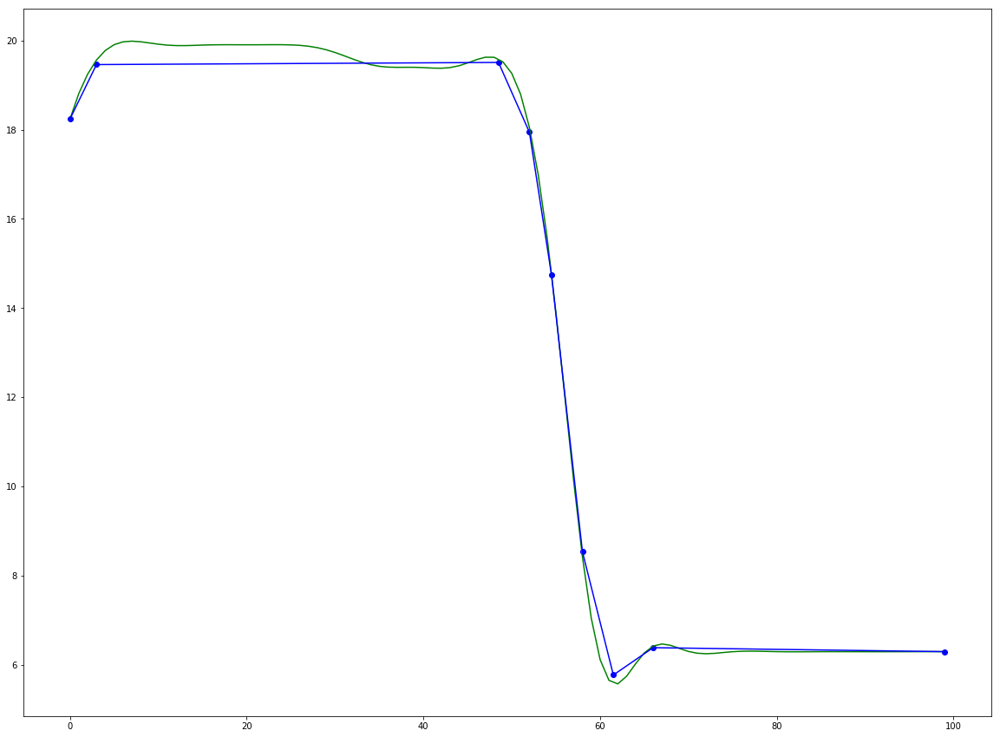

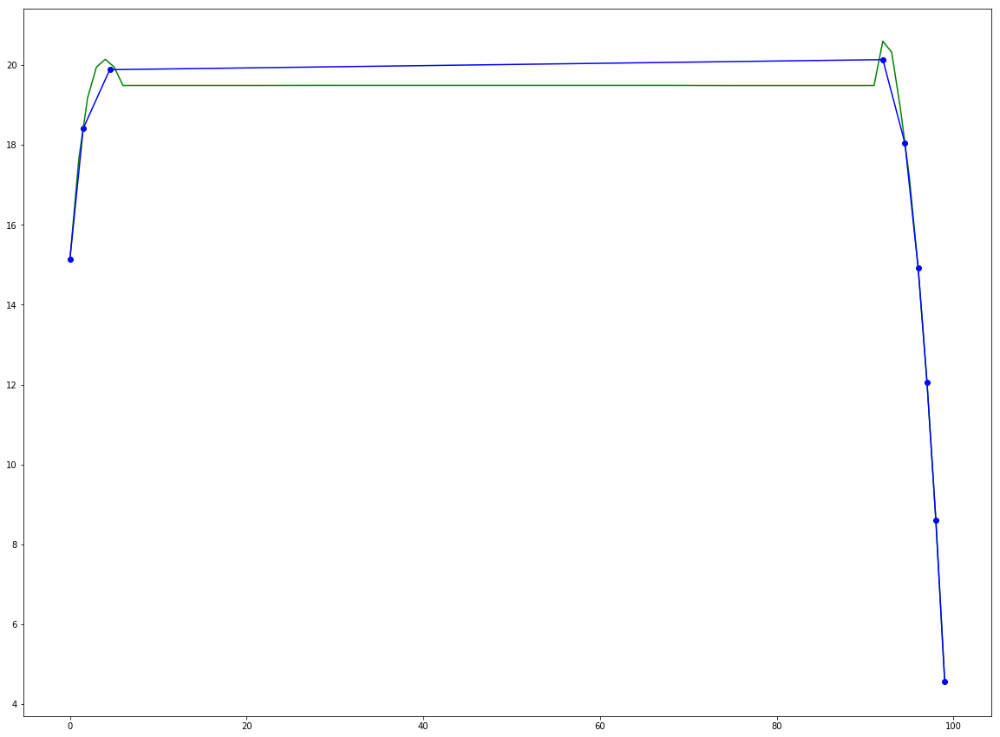

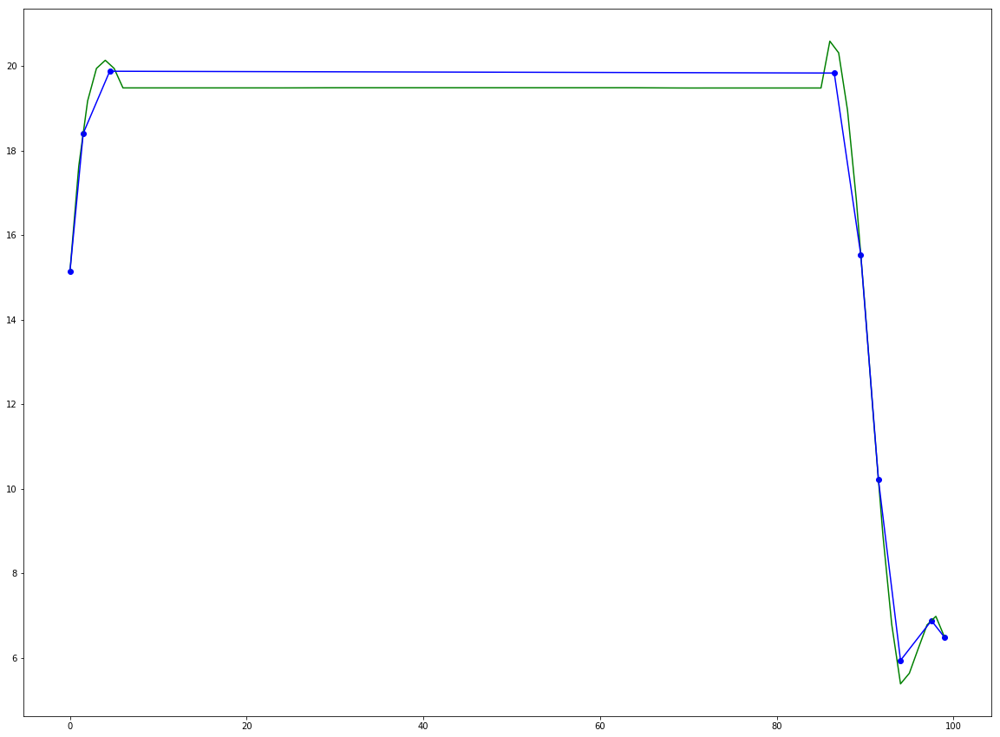

...

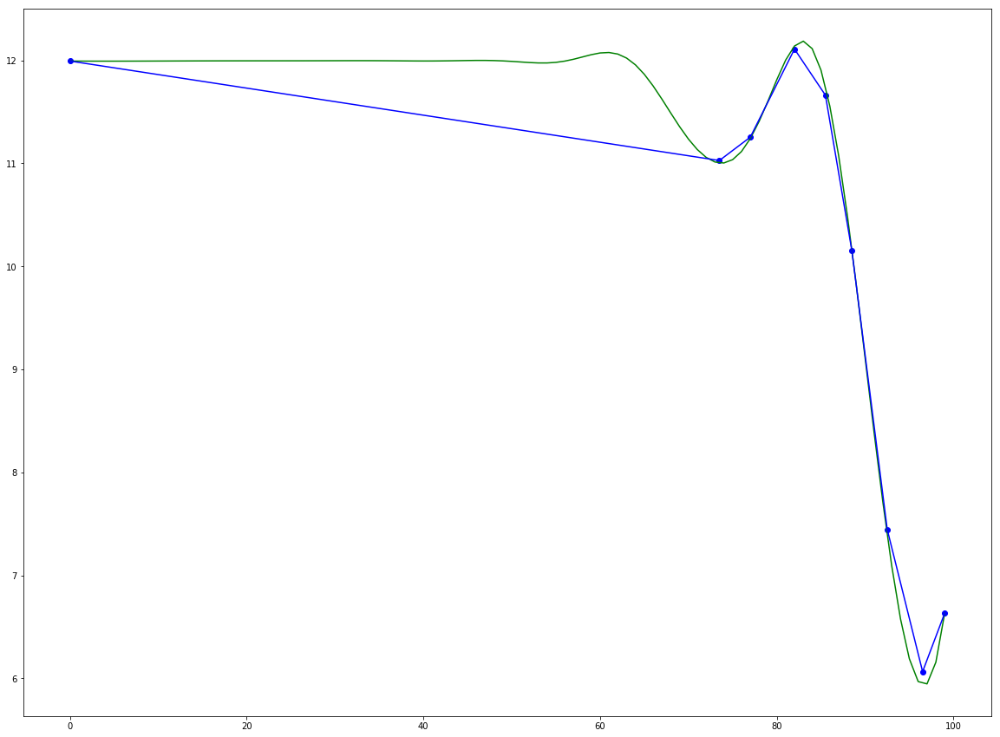

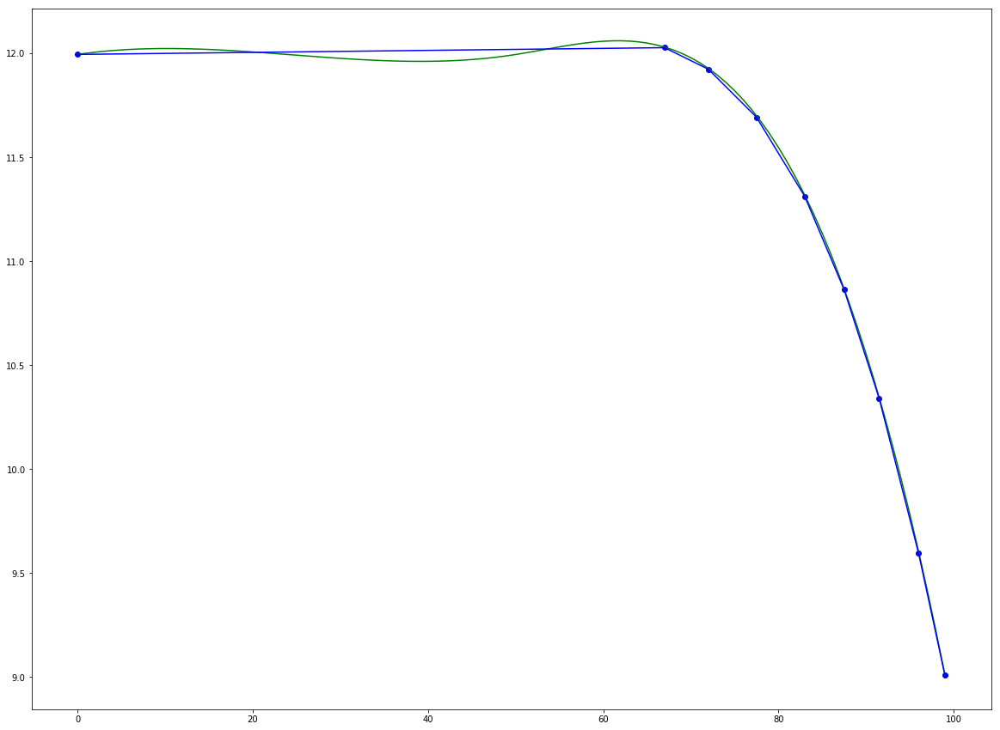

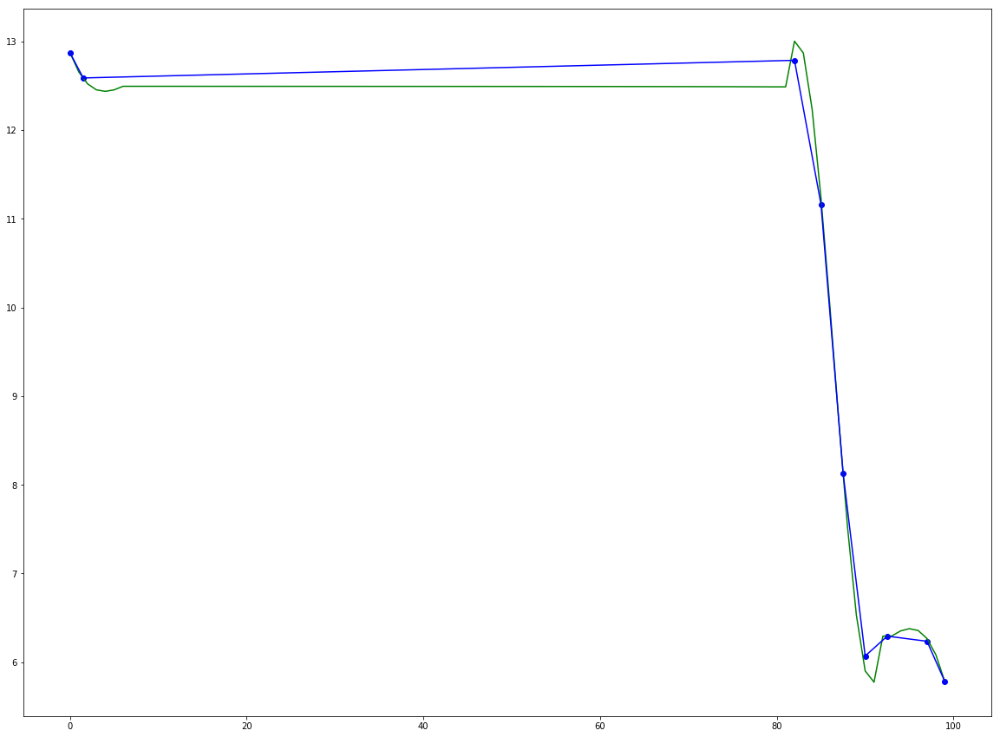

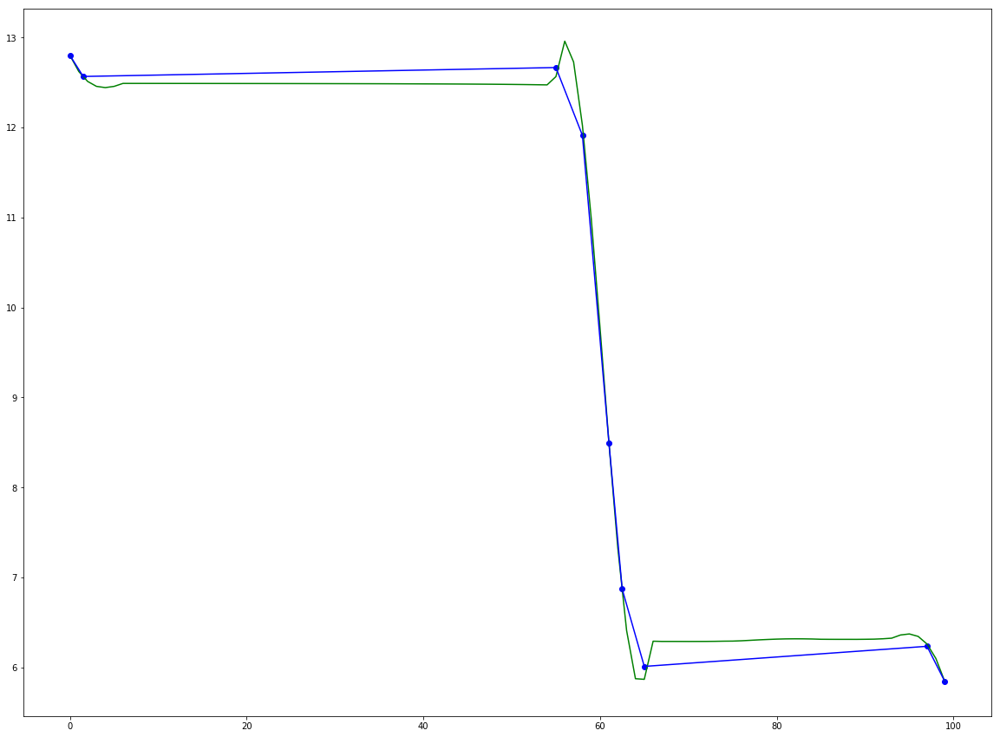

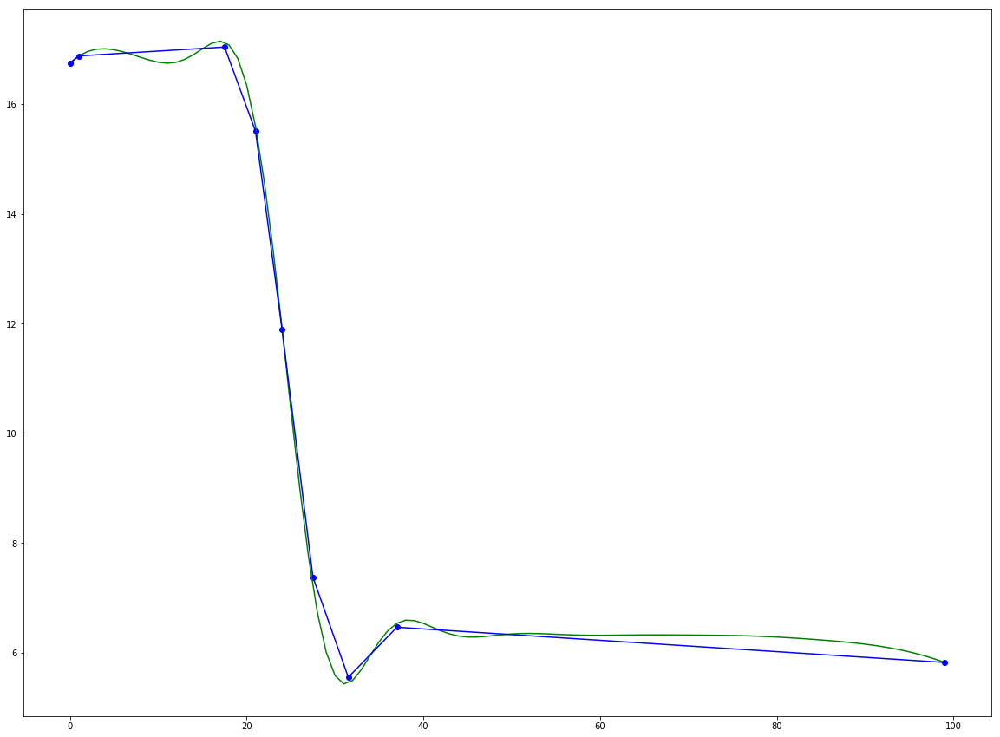

In [167]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

for p in df.columns:
    figure(figsize(20,15))
    df[p].plot(c='g')
    dif= np.diff(df[p])
    #plt.plot(dif,c='r')
    dif= np.diff(dif)
    dif= abs(dif)
    #plt.plot(dif,c='b')
    #plt.plot([0,100],[0.5,0.5],c='k')
    #print(dif.argsort()[-5:][::-1])
    idx= np.where(dif>dif.mean())[0]+1
    #idx= dif.argsort()[-10:]+1
    #dif= dif[idx]
    X = numpy.hstack((idx,df[p].values[idx])).reshape((-1,2),order='F')
#     silhouette_avg_prev= None
#     ncmin= 0
#     for nc in range(3,15):
#         km= KMeans(n_clusters=nc, random_state=0).fit(X)
#         cluster_labels= km.fit_predict(X)
#         silhouette_avg = silhouette_score(X, cluster_labels)
#         if not silhouette_avg_prev or silhouette_avg<silhouette_avg_prev:
#             silhouette_avg_prev= silhouette_avg
#             km_min= km
#             ncmin= nc
    km= KMeans(n_clusters=7, random_state=0).fit(X)
    #plt.scatter(idx, df[p].values[idx],c='b')
    centers= km.cluster_centers_
    centers= np.vstack( (centers, [0, df[p].values[0]]) )
    centers= np.vstack( (centers, [99, df[p].values[99]]) )
    centers= centers[centers[:,0].argsort()]
    
    plt.plot(centers[:,0], centers[:,1],c='b')
    plt.scatter(centers[:,0], centers[:,1],c='b')
    plt.show()
    plt.close()

In [14]:
df.corr().head(5)

,2mm_EXTRALARGE_DATASET_mem.dat,2mm_LARGE_DATASET_mem.dat,2mm_MEDIUM_DATASET_mem.dat,3mm_EXTRALARGE_DATASET_mem.dat,3mm_LARGE_DATASET_mem.dat,3mm_MEDIUM_DATASET_mem.dat,adi_EXTRALARGE_DATASET_mem.dat,adi_LARGE_DATASET_mem.dat,adi_MEDIUM_DATASET_mem.dat,atax_EXTRALARGE_DATASET_mem.dat,...,syr2k_LARGE_DATASET_mem.dat,syr2k_MEDIUM_DATASET_mem.dat,syrk_EXTRALARGE_DATASET_mem.dat,syrk_LARGE_DATASET_mem.dat,syrk_MEDIUM_DATASET_mem.dat,trisolv_EXTRALARGE_DATASET_mem.dat,trisolv_LARGE_DATASET_mem.dat,trmm_EXTRALARGE_DATASET_mem.dat,trmm_LARGE_DATASET_mem.dat,trmm_MEDIUM_DATASET_mem.dat
2mm_EXTRALARGE_DATASET_mem.dat,1.000000,0.615931,0.324732,0.880939,0.832195,0.385557,0.862825,0.985596,0.475953,0.721201,...,0.517242,0.287779,0.654483,0.381568,0.209825,0.812612,0.791813,0.646208,0.344068,0.169080
2mm_LARGE_DATASET_mem.dat,0.615931,1.000000,0.523567,0.465318,0.783567,0.648549,0.452344,0.634013,0.823309,0.388612,...,0.873702,0.438826,0.972022,0.617786,0.332599,0.826275,0.915334,0.942988,0.564254,0.275948
2mm_MEDIUM_DATASET_mem.dat,0.324732,0.523567,1.000000,0.199610,0.364525,0.830855,0.175123,0.276194,0.648099,-0.311922,...,0.597850,0.861323,0.454009,0.848018,0.680339,0.483375,0.516300,0.457347,0.941238,0.552739
3mm_EXTRALARGE_DATASET_mem.dat,0.880939,0.465318,0.199610,1.000000,0.633686,0.256985,0.985930,0.825379,0.343670,0.740121,...,0.383571,0.158954,0.501427,0.260037,0.104655,0.614164,0.658117,0.500830,0.227954,0.083767
3mm_LARGE_DATASET_mem.dat,0.832195,0.783567,0.364525,0.633686,1.000000,0.464656,0.610116,0.882029,0.604906,0.675502,...,0.643159,0.293395,0.858125,0.443708,0.216774,0.962649,0.898233,0.870052,0.401272,0.185327


In [ ]:
# This generates 100 variables that could possibly be assigned to 5 clusters
n_variables = 100
n_clusters = 5
n_samples = 1000

# To keep this example simple, each cluster will have a fixed size
cluster_size = n_variables // n_clusters

# Assign each variable to a cluster
belongs_to_cluster = np.repeat(range(n_clusters), cluster_size)
np.random.shuffle(belongs_to_cluster)

# This latent data is used to make variables that belong
# to the same cluster correlated.
latent = np.random.randn(n_clusters, n_samples)

variables = []
for i in range(n_variables):
    variables.append(
        np.random.randn(n_samples) + latent[belongs_to_cluster[i], :]
    )

variables = np.array(variables)

C = df.values

def score(C):
    '''
    Function to assign a score to an ordered covariance matrix.
    High correlations within a cluster improve the score.
    High correlations between clusters decease the score.
    '''
    score = 0
    for cluster in range(n_clusters):
        inside_cluster = np.arange(cluster_size) + cluster * cluster_size
        outside_cluster = np.setdiff1d(range(n_variables), inside_cluster)

        # Belonging to the same cluster
        score += np.sum(C[inside_cluster, :][:, inside_cluster])

        # Belonging to different clusters
        score -= np.sum(C[inside_cluster, :][:, outside_cluster])
        score -= np.sum(C[outside_cluster, :][:, inside_cluster])

    return score


initial_C = C
initial_score = score(C)
initial_ordering = np.arange(n_variables)

plt.figure()
plt.imshow(C, interpolation='nearest')
plt.title('Initial C')
print 'Initial ordering:', initial_ordering
print 'Initial covariance matrix score:', initial_score

# Pretty dumb greedy optimization algorithm that continuously
# swaps rows to improve the score
def swap_rows(C, var1, var2):
    '''
    Function to swap two rows in a covariance matrix,
    updating the appropriate columns as well.
    '''
    D = C.copy()
    D[var2, :] = C[var1, :]
    D[var1, :] = C[var2, :]

    E = D.copy()
    E[:, var2] = D[:, var1]
    E[:, var1] = D[:, var2]

    return E

current_C = C
current_ordering = initial_ordering
current_score = initial_score

max_iter = 1000
for i in range(max_iter):
    # Find the best row swap to make
    best_C = current_C
    best_ordering = current_ordering
    best_score = current_score
    for row1 in range(n_variables):
        for row2 in range(n_variables):
            if row1 == row2:
                continue
            option_ordering = best_ordering.copy()
            option_ordering[row1] = best_ordering[row2]
            option_ordering[row2] = best_ordering[row1]
            option_C = swap_rows(best_C, row1, row2)
            option_score = score(option_C)

            if option_score > best_score:
                best_C = option_C
                best_ordering = option_ordering
                best_score = option_score

    if best_score > current_score:
        # Perform the best row swap
        current_C = best_C
        current_ordering = best_ordering
        current_score = best_score
    else:
        # No row swap found that improves the solution, we're done
        break

# Output the result
plt.figure()
plt.imshow(current_C, interpolation='nearest')
plt.title('Best C')

In [ ]:
df= pd.read_csv('comparison_all_2.csv',index_col=0)
df.index= df.columns
df= df.replace(0,df.mean())
df= df.head(1)
figure(figsize=(30,5))
ax= heatmap(df)
#ax.xaxis.set_ticks_position('top')
#savefig('hehe.png')
#df

In [33]:
s= [x for x in df.columns if 'adi' in x]
df[s].head(1)

,adi_EXTRALARGE_DATASET_mem.dat,adi_LARGE_DATASET_mem.dat,adi_MEDIUM_DATASET_mem.dat
2mm_EXTRALARGE_DATASET_mem.dat,0.357135,0.306689,3.45706


In [9]:
#df.drop()